In [1]:
#importing libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import colors
import plotly.graph_objs as go
from plotly.offline import iplot
from plotly.subplots import make_subplots
from scipy import stats
from scipy.stats import norm, skew


from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [2]:
data = pd.read_csv("credit_card_fraud.csv")
df1 = data.copy()
df1.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0
3,2019-01-01 00:09:03,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0
4,2019-01-01 00:21:32,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0


In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339607 entries, 0 to 339606
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   trans_date_trans_time  339607 non-null  object 
 1   merchant               339607 non-null  object 
 2   category               339607 non-null  object 
 3   amt                    339607 non-null  float64
 4   city                   339607 non-null  object 
 5   state                  339607 non-null  object 
 6   lat                    339607 non-null  float64
 7   long                   339607 non-null  float64
 8   city_pop               339607 non-null  int64  
 9   job                    339607 non-null  object 
 10  dob                    339607 non-null  object 
 11  trans_num              339607 non-null  object 
 12  merch_lat              339607 non-null  float64
 13  merch_long             339607 non-null  float64
 14  is_fraud               339607 non-nu

### DATA CONTENT 

- This dataset consists of credit card transactions in the western United States. It includes information about each transaction including customer details, the merchant and category of purchase, and whether or not the transaction was a fraud.
- The dataset contains a total of 339607 rows and 15 Columns. 
- It doesn't present nun values on the first step.
- It contains different important features which are going to explored on the next steps to achieve a better insight. 
- Data Dictionary
-- transdatetrans_time	Transaction DateTime
-- merchant	Merchant Name
-- category	Category of Merchant
-- amt	Amount of Transaction
-- city	City of Credit Card Holder
-- state	State of Credit Card Holder
-- lat	Latitude Location of Purchase
-- long	Longitude Location of Purchase
-- city_pop	Credit Card Holder's City Population
-- job	Job of Credit Card Holder
-- dob	Date of Birth of Credit Card Holder
-- trans_num	Transaction Number
-- merch_lat	Latitude Location of Merchant
-- merch_long	Longitude Location of Merchant
-- is_fraud	Whether Transaction is Fraud (1) or Not (0)


In [4]:
# Identify the values for ==> is_fraud
df1["is_fraud"].unique()

array([0, 1], dtype=int64)

In [5]:
# Identify the values for ==> is_fraud
df1["trans_num"].unique()

array(['1f76529f8574734946361c461b024d99',
       'a1a22d70485983eac12b5b88dad1cf95',
       '413636e759663f264aae1819a4d4f231', ...,
       '9b1f753c79894c9f4b71f04581835ada',
       '6c5b7c8add471975aa0fec023b2e8408',
       '14392d723bb7737606b2700ac791b7aa'], dtype=object)

In [6]:
# Identify the values for ==> merch_long
df1["merch_long"].unique()

array([-118.186462, -112.154481, -122.230347, ...,  -91.333331,
       -119.715054, -117.080888])

In [7]:
# Identify the values for ==> merch_lat
df1["merch_lat"].unique()

array([49.159047, 43.150704, 41.65752 , ..., 39.946837, 46.65834 ,
       44.470525])

In [8]:
# Identify the values for ==> category 
df1["category"].unique()

array(['grocery_pos', 'entertainment', 'shopping_pos', 'misc_pos',
       'shopping_net', 'gas_transport', 'misc_net', 'grocery_net',
       'food_dining', 'health_fitness', 'kids_pets', 'home',
       'personal_care', 'travel'], dtype=object)

In [9]:
# Identify the values for ==> amt
df1["amt"].unique()

array([ 107.23,  220.11,   96.29, ...,  182.18,  146.79, 1309.21])

In [10]:
# check for missing values
total = df1.isnull().sum().sort_values(ascending = False)
percent = (df1.isnull().sum()/df1.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

# there is no missing values in the dataset

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Dropping columns 

- The column ==> merchant: contains unique categories, which are not relevant for the analysis, for this reason we drop the column. 
- The columns ==> city and state :represents the location of the card holder. This is not a feature relevant in our analysis for this reason we drop both columns. 
- The column ==> city_pop: represents the population of the city, which is unrelevant in our analysis, we drop the column. 
- The column ==> job: contains the job position of the card holder, which is not related with fraud detection, since the card holders give just their initial occupation. We drop this column. 
- The column ==> trans_num: contains the alphanumeric unic values, for that reason we are not going to keep them.
- The column ==> dob, represents the date of birth of the card holder, we keep this column and we are goign to transform it into Age, for ML purposes. 

### PREPARATION OF FEATURES
- dob to Age
- trans_date_trans_time to Year, month, day, hour, minute, second. 

In [11]:
df1 = df1.drop(columns=['merchant','city','state','city_pop','job','trans_num'])
# Let's update changes 
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339607 entries, 0 to 339606
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   trans_date_trans_time  339607 non-null  object 
 1   category               339607 non-null  object 
 2   amt                    339607 non-null  float64
 3   lat                    339607 non-null  float64
 4   long                   339607 non-null  float64
 5   dob                    339607 non-null  object 
 6   merch_lat              339607 non-null  float64
 7   merch_long             339607 non-null  float64
 8   is_fraud               339607 non-null  int64  
dtypes: float64(5), int64(1), object(3)
memory usage: 23.3+ MB


In [12]:
# Convert datetime_column to datetime format
df1['trans_date_trans_time'] = pd.to_datetime(df1['trans_date_trans_time'])

# Extract year, month, day, hour, minute, and second components
df1['year'] = df1['trans_date_trans_time'].dt.year
df1['month'] = df1['trans_date_trans_time'].dt.month
df1['day'] = df1['trans_date_trans_time'].dt.day
df1['hour'] = df1['trans_date_trans_time'].dt.hour
df1['minute'] = df1['trans_date_trans_time'].dt.minute
df1['second'] = df1['trans_date_trans_time'].dt.second

# Display the modified DataFrame
print(df1)

       trans_date_trans_time        category     amt      lat      long  \
0        2019-01-01 00:00:44     grocery_pos  107.23  48.8878 -118.2105   
1        2019-01-01 00:00:51   entertainment  220.11  42.1808 -112.2620   
2        2019-01-01 00:07:27     grocery_pos   96.29  41.6125 -122.5258   
3        2019-01-01 00:09:03    shopping_pos    7.77  32.9396 -105.8189   
4        2019-01-01 00:21:32        misc_pos    6.85  43.0172 -111.0292   
...                      ...             ...     ...      ...       ...   
339602   2020-12-31 23:57:56            home   12.68  64.7556 -165.6723   
339603   2020-12-31 23:58:04       kids_pets   13.02  41.5403 -122.9366   
339604   2020-12-31 23:59:07  health_fitness   43.77  40.4931  -91.8912   
339605   2020-12-31 23:59:15       kids_pets   86.88  46.1966 -118.9017   
339606   2020-12-31 23:59:24          travel    7.99  44.6255 -116.4493   

               dob  merch_lat  merch_long  is_fraud  year  month  day  hour  \
0       1978-06-21  

In [13]:
from datetime import datetime

# Sample DataFrame with DOB column
#data = pd.df1
# Convert DOB column to datetime
df1['dob'] = pd.to_datetime(df1['dob'])

# Calculate age
current_date = datetime.now()
df1['Age'] = (current_date - df1['dob']).dt.days // 365  # Age in years

# Display the modified DataFrame
print(df1)

       trans_date_trans_time        category     amt      lat      long  \
0        2019-01-01 00:00:44     grocery_pos  107.23  48.8878 -118.2105   
1        2019-01-01 00:00:51   entertainment  220.11  42.1808 -112.2620   
2        2019-01-01 00:07:27     grocery_pos   96.29  41.6125 -122.5258   
3        2019-01-01 00:09:03    shopping_pos    7.77  32.9396 -105.8189   
4        2019-01-01 00:21:32        misc_pos    6.85  43.0172 -111.0292   
...                      ...             ...     ...      ...       ...   
339602   2020-12-31 23:57:56            home   12.68  64.7556 -165.6723   
339603   2020-12-31 23:58:04       kids_pets   13.02  41.5403 -122.9366   
339604   2020-12-31 23:59:07  health_fitness   43.77  40.4931  -91.8912   
339605   2020-12-31 23:59:15       kids_pets   86.88  46.1966 -118.9017   
339606   2020-12-31 23:59:24          travel    7.99  44.6255 -116.4493   

              dob  merch_lat  merch_long  is_fraud  year  month  day  hour  \
0      1978-06-21  49

| category       | Ca_transaction  |
|----------------|-----------------|
|grocery_pos     |  1              |
|entertainment   |  2              |
|shopping_pos    |  3              |
|misc_pos        |  4              |
|shopping_net    |  5              |
|gas_transport   |  6              |
|misc_net        |  7              |
|grocery_net     |  8              |
|food_dining     |  9              |
|health_fitness  |  10             |   
|kids_pets       |  11             |
|home            |  12             |
|personal_care   |  13             |
|travel          |  14             |

In order to use the features of the column  category: we will need to repalce the categorical values for numerical values, corresponding to each category as described it below. 

In [14]:
df1 = df1.replace(['grocery_pos','entertainment','shopping_pos','misc_pos','shopping_net','gas_transport',
                 'misc_net','grocery_net','food_dining','health_fitness','kids_pets','home','personal_care',
               'travel'],[1,2,3,4,5,6,7,8,9,10,11,12,13,14])

In [15]:
# Droping columns showing duplicate features information 
df1 = df1.drop(columns=['trans_date_trans_time','dob'])
# Let's update changes 
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339607 entries, 0 to 339606
Data columns (total 14 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   category    339607 non-null  int64  
 1   amt         339607 non-null  float64
 2   lat         339607 non-null  float64
 3   long        339607 non-null  float64
 4   merch_lat   339607 non-null  float64
 5   merch_long  339607 non-null  float64
 6   is_fraud    339607 non-null  int64  
 7   year        339607 non-null  int64  
 8   month       339607 non-null  int64  
 9   day         339607 non-null  int64  
 10  hour        339607 non-null  int64  
 11  minute      339607 non-null  int64  
 12  second      339607 non-null  int64  
 13  Age         339607 non-null  int64  
dtypes: float64(5), int64(9)
memory usage: 36.3 MB


In [16]:
# Lets group the numerical values related with the feature: VALUE
df1.groupby("amt").mean()

,category,lat,long,merch_lat,merch_long,is_fraud,year,month,day,hour,minute,second,Age
amt,,,,,,,,,,,,,
1.00,5.396825,40.048335,-111.362960,40.085803,-111.385467,0.0,2019.412698,6.523810,14.746032,12.984127,32.936508,29.603175,50.507937
1.01,6.263158,40.091632,-110.828083,40.128668,-110.966498,0.0,2019.503759,7.082707,15.015038,12.406015,28.338346,30.721805,51.406015
1.02,7.439655,39.888663,-111.938726,39.904386,-111.973135,0.0,2019.387931,7.603448,15.793103,13.258621,28.068966,27.922414,50.577586
1.03,6.192857,39.390426,-110.934184,39.360469,-110.914853,0.0,2019.507143,7.542857,16.821429,13.100000,28.571429,30.321429,52.285714
1.04,6.611511,39.549989,-111.951681,39.522020,-111.972136,0.0,2019.446043,6.992806,14.338129,13.388489,30.035971,30.949640,50.079137
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13106.14,14.000000,41.641400,-96.523200,42.377626,-97.466696,0.0,2019.000000,8.000000,7.000000,14.000000,0.000000,27.000000,49.000000
14238.11,14.000000,41.053900,-106.076300,41.247869,-106.200065,0.0,2020.000000,5.000000,12.000000,13.000000,5.000000,0.000000,49.000000
14407.25,14.000000,40.626700,-96.745600,41.617800,-97.090078,0.0,2019.000000,7.000000,6.000000,13.000000,42.000000,49.000000,56.000000


In [17]:
def get_total_duplicate_rows(df1):
    # Read the dataset into a Pandas DataFrame
    df1 = pd.read_csv(df1)

    # Find duplicate rows in the DataFrame
    duplicate_mask = df1.duplicated()

    # Get the total number of duplicated rows
    total_duplicates = duplicate_mask.sum()

    return total_duplicates

# Test the function
csv_file = "credit_card_fraud.csv"
total_duplicates = get_total_duplicate_rows(csv_file)
print("Total duplicated rows:", total_duplicates)

Total duplicated rows: 0


<Figure size 1800x400 with 0 Axes>

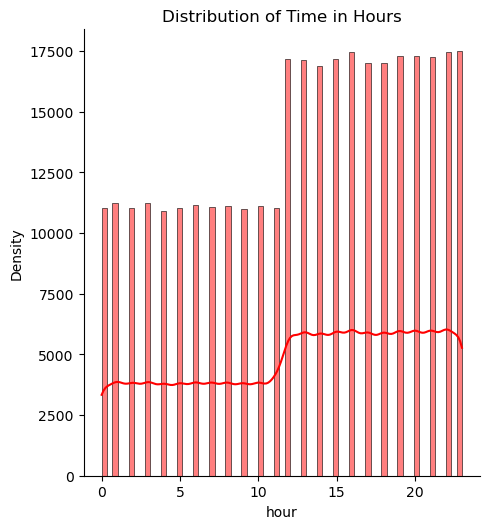

In [18]:
# Plot the distribution of time in hours using displot
plt.figure(figsize=(18, 4))
sns.displot(df1['hour'].values, color='r', kde=True)  # Use displot
plt.title('Distribution of Time in Hours')
plt.xlabel('hour')
plt.ylabel('Density')
plt.show()

In [19]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339607 entries, 0 to 339606
Data columns (total 14 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   category    339607 non-null  int64  
 1   amt         339607 non-null  float64
 2   lat         339607 non-null  float64
 3   long        339607 non-null  float64
 4   merch_lat   339607 non-null  float64
 5   merch_long  339607 non-null  float64
 6   is_fraud    339607 non-null  int64  
 7   year        339607 non-null  int64  
 8   month       339607 non-null  int64  
 9   day         339607 non-null  int64  
 10  hour        339607 non-null  int64  
 11  minute      339607 non-null  int64  
 12  second      339607 non-null  int64  
 13  Age         339607 non-null  int64  
dtypes: float64(5), int64(9)
memory usage: 36.3 MB


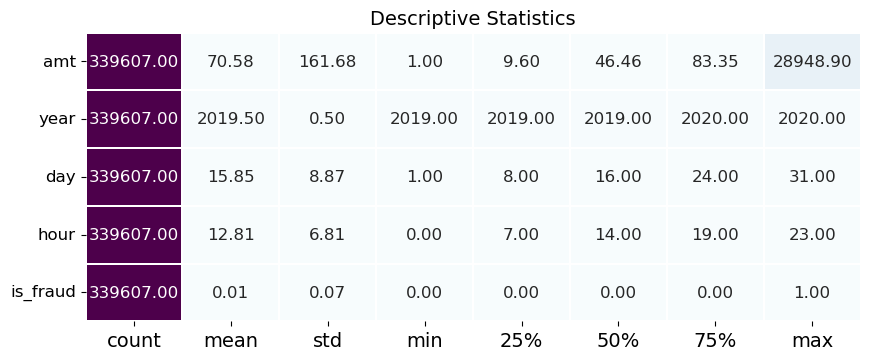

In [20]:
# statistical summary:
cols = df1[["amt","year","day","hour","is_fraud"]]
cmap1 = 'BuPu'
def desc_stats(dataframe):
    desc = dataframe.describe().T
    f,ax = plt.subplots(figsize=(10,
                                 desc.shape[0] * 0.75))
    sns.heatmap(desc,
                annot = True,
                cmap = cmap1,
                fmt= '.2f',
                ax = ax,
                linecolor = 'white',
                linewidths = 1.3,
                cbar = False,
                annot_kws = {"size": 12})
    plt.xticks(size = 14)
    plt.yticks(size = 12,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 14)
    plt.show()
    
desc_stats(cols)

In [21]:
# correlation matrix
corr = df1.corr()
corr.style.background_gradient(cmap='BuPu')

,category,amt,lat,long,merch_lat,merch_long,is_fraud,year,month,day,hour,minute,second,Age
category,1.000000,-0.078873,0.001284,-0.001489,0.001410,-0.001498,-0.037075,0.000008,0.004093,-0.000598,0.448752,-0.001565,0.000854,0.017708
amt,-0.078873,1.000000,0.002817,-0.007017,0.002957,-0.006891,0.201023,-0.001540,-0.001089,0.001306,-0.032631,-0.002192,-0.000708,-0.011414
lat,0.001284,0.002817,1.000000,-0.151364,0.993646,-0.151267,0.009239,0.000040,-0.003718,-0.000737,-0.012251,0.000982,-0.003132,0.161390
long,-0.001489,-0.007017,-0.151364,1.000000,-0.150385,0.998960,-0.004494,0.000750,-0.000303,-0.000682,0.022051,-0.001742,-0.000857,-0.092202
merch_lat,0.001410,0.002957,0.993646,-0.150385,1.000000,-0.150278,0.008848,0.000019,-0.003587,-0.000780,-0.011991,0.001196,-0.003400,0.160473
merch_long,-0.001498,-0.006891,-0.151267,0.998960,-0.150278,1.000000,-0.004550,0.000821,-0.000206,-0.000676,0.021973,-0.001886,-0.000912,-0.091943
is_fraud,-0.037075,0.201023,0.009239,-0.004494,0.008848,-0.004550,1.000000,-0.006991,-0.017812,0.001108,0.012388,0.001546,-0.000643,0.013177
year,0.000008,-0.001540,0.000040,0.000750,0.000019,0.000821,-0.006991,1.000000,0.002554,0.001294,0.000447,0.000735,0.001333,-0.003025
month,0.004093,-0.001089,-0.003718,-0.000303,-0.003587,-0.000206,-0.017812,0.002554,1.000000,0.010339,-0.002172,0.002352,0.002744,0.000628
day,-0.000598,0.001306,-0.000737,-0.000682,-0.000780,-0.000676,0.001108,0.001294,0.010339,1.000000,-0.000229,0.000853,0.000248,0.000654


In [22]:
# Drop the columns that have no relationship for our analysis 
df1 = df1.drop(columns=['merch_long','long','year','month','day'])
# Let's update changes 
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339607 entries, 0 to 339606
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   category   339607 non-null  int64  
 1   amt        339607 non-null  float64
 2   lat        339607 non-null  float64
 3   merch_lat  339607 non-null  float64
 4   is_fraud   339607 non-null  int64  
 5   hour       339607 non-null  int64  
 6   minute     339607 non-null  int64  
 7   second     339607 non-null  int64  
 8   Age        339607 non-null  int64  
dtypes: float64(3), int64(6)
memory usage: 23.3 MB


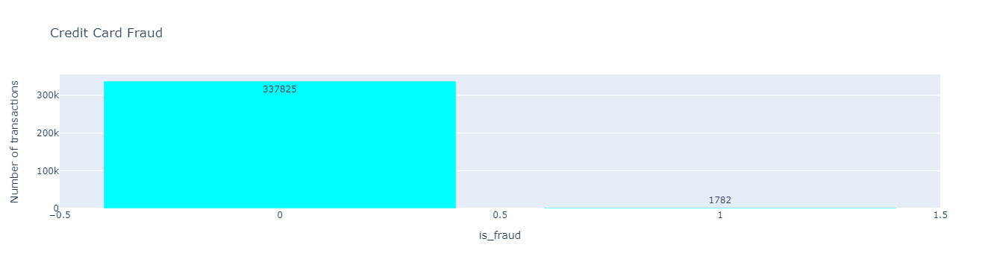

In [23]:
# check for class imbalance

temp = df1["is_fraud"].value_counts()
df_p = pd.DataFrame({'is_fraud': temp.index,'values': temp.values})

trace = go.Bar(
    x = df_p['is_fraud'],y = df_p['values'],
    name="Credit Card Fraud  - data unbalance (Not fraud = 0, Fraud = 1)",
    marker=dict(color="#00FFFF"),
    text=df_p['values']
)
data = [trace]
layout = dict(title = 'Credit Card Fraud',
          xaxis = dict(title = 'is_fraud', showticklabels=True), 
          yaxis = dict(title = 'Number of transactions'),
          hovermode = 'closest',width=600
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='is_fraud')

DATA VISUALISATION 

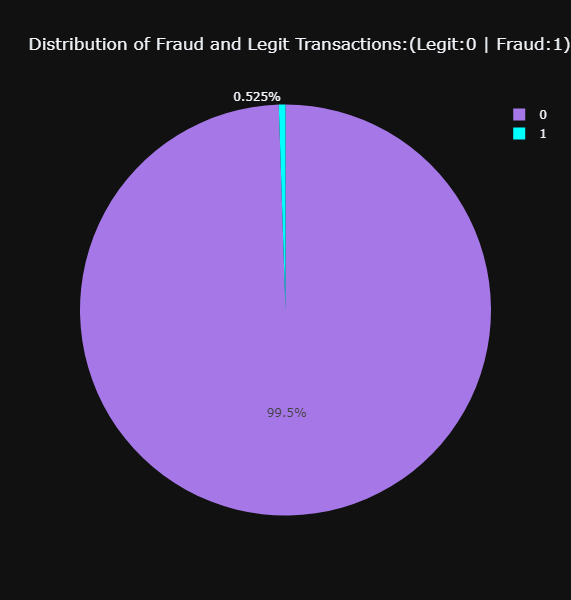

In [24]:
# Distribution of Fraud and Legit Transactions

px.pie(df1, names="is_fraud", title="Distribution of Fraud and Legit Transactions:(Legit:0 | Fraud:1)", color_discrete_sequence=['#A678E7', '#00FFFF'],
       template="plotly_dark", width=800, height=600)

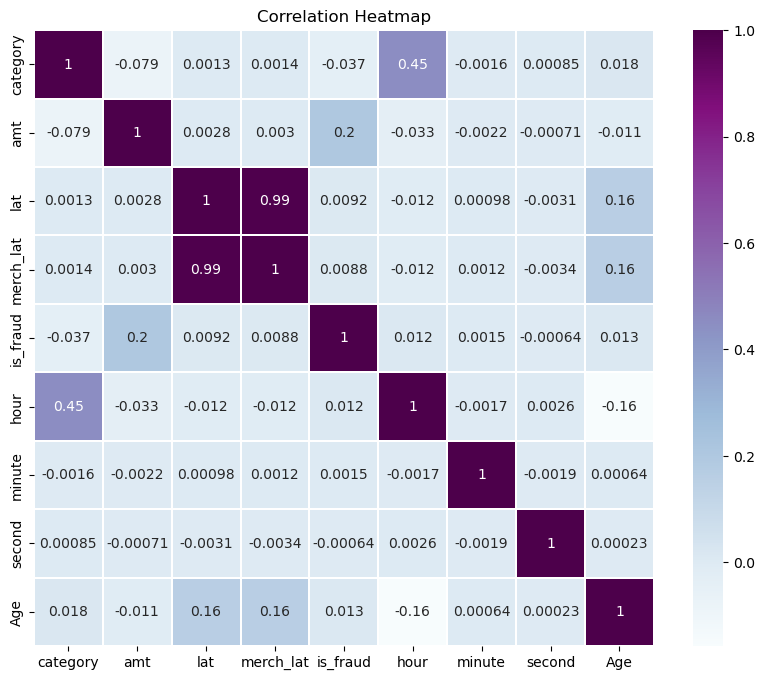

In [26]:
# correlation heatmap:
# Create a correlation matrix
corr = df1.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, linewidths=0.1, cmap="BuPu", annot=True)
plt.title('Correlation Heatmap')
plt.show()

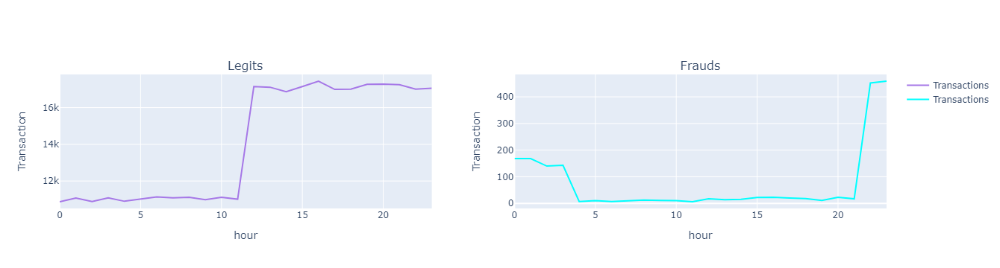

In [28]:
# time vs fraud

# Transaction count with non frauds over time(Hour)
count_0 = df1[df1['is_fraud']==0].groupby('hour').count()["is_fraud"]

# Transaction count with frauds over time(Hour)
count_1 = df1[df1['is_fraud']==1].groupby('hour').count()["is_fraud"]

# Concatenate
counts_df = pd.concat([count_0, count_1], axis=1, keys=["is_fraud 0", "is_fraud 1"]).fillna(0)
df_counts = counts_df.reset_index()


# Subplots
fig = make_subplots(
    rows=1, cols=2,

    subplot_titles=("Legits","Frauds"))


fig.add_trace(go.Scatter(x=df_counts["hour"], y=df_counts["is_fraud 0"], name="Transactions", marker = {'color' : "#A678E7"}),
                 row=1, col=1)

fig.add_trace(go.Scatter(x=df_counts["hour"], y=df_counts["is_fraud 1"], name="Transactions", marker = {'color' : "#00FFFF"}),
                 row=1, col=2)

fig['layout']['xaxis']['title']='hour'
fig['layout']['yaxis']['title']='Transaction'
fig['layout']['xaxis2']['title']='hour'
fig['layout']['yaxis2']['title']='Transaction'

fig.show()

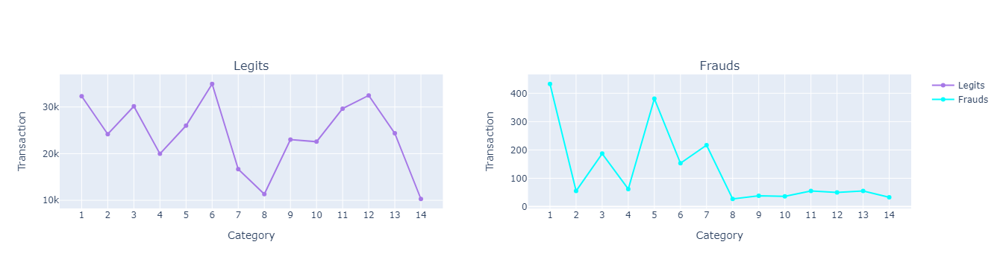

In [30]:
# Subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Legits", "Frauds"))

fig.add_trace(go.Scatter(x=df_counts["category"], y=df_counts["is_fraud 0"], name="Legits", marker={'color': "#A678E7"}),
              row=1, col=1)

fig.add_trace(go.Scatter(x=df_counts["category"], y=df_counts["is_fraud 1"], name="Frauds", marker={'color': "#00FFFF"}),
              row=1, col=2)

# Set custom x-axis tick interval
custom_dtick = 1  # Adjust this value to control the interval between ticks
fig.update_xaxes(dtick=custom_dtick, row=1, col=1)
fig.update_xaxes(dtick=custom_dtick, row=1, col=2)

# Update axis titles
fig.update_xaxes(title_text='Category', row=1, col=1)
fig.update_yaxes(title_text='Transaction', row=1, col=1)
fig.update_xaxes(title_text='Category', row=1, col=2)
fig.update_yaxes(title_text='Transaction', row=1, col=2)

fig.show()

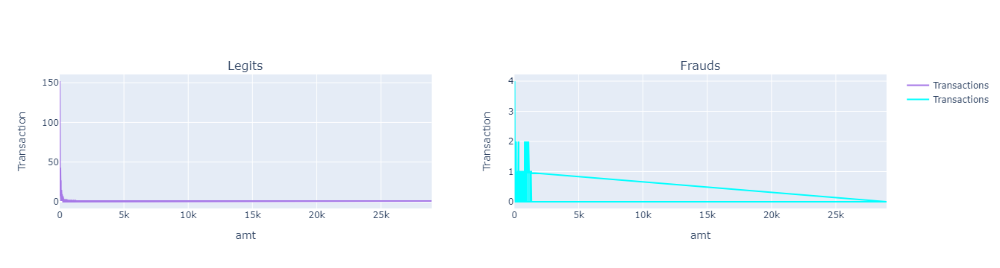

In [31]:
# Amt vs fraud

# Transaction count with non frauds over time(Hour)
count_0 = df1[df1['is_fraud']==0].groupby('amt').count()["is_fraud"]

# Transaction count with frauds over time(Hour)
count_1 = df1[df1['is_fraud']==1].groupby('amt').count()["is_fraud"]

# Concatenate
counts_df = pd.concat([count_0, count_1], axis=1, keys=["is_fraud 0", "is_fraud 1"]).fillna(0)
df_counts = counts_df.reset_index()


# Subplots
fig = make_subplots(
    rows=1, cols=2,

    subplot_titles=("Legits","Frauds"))


fig.add_trace(go.Scatter(x=df_counts["amt"], y=df_counts["is_fraud 0"], name="Transactions", marker = {'color' : "#A678E7"}),
                 row=1, col=1)

fig.add_trace(go.Scatter(x=df_counts["amt"], y=df_counts["is_fraud 1"], name="Transactions", marker = {'color' : "#00FFFF"}),
                 row=1, col=2)

fig['layout']['xaxis']['title']='amt'
fig['layout']['yaxis']['title']='Transaction'
fig['layout']['xaxis2']['title']='amt'
fig['layout']['yaxis2']['title']='Transaction'

fig.show()


DATA PROCESSING 

In [32]:
X=df1.drop(["is_fraud"],axis=1).values
y=df1["is_fraud"].values

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [33]:
# standardization of data
sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

MODEL TRAINING AND EVALUATING

C:\Users\ele_9\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



KNeighborsClassifier Model Test Accuracy Score is:  0.9963634757515974
KNeighborsClassifier Model Test F1 Score is:  0.5383177570093458
KNeighborsClassifier Mean_absolute_error:  0.0036365242484025792
KNeighborsClassifier Mean_squared_error:  0.0036365242484025792
KNeighborsClassifier Root_mean_squared_error:  0.06030360062552301
KNeighborsClassifier R2_score:  0.3233191967711445
KNeighborsClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.86      0.39      0.54       367

    accuracy                           1.00     67922
   macro avg       0.93      0.70      0.77     67922
weighted avg       1.00      1.00      1.00     67922



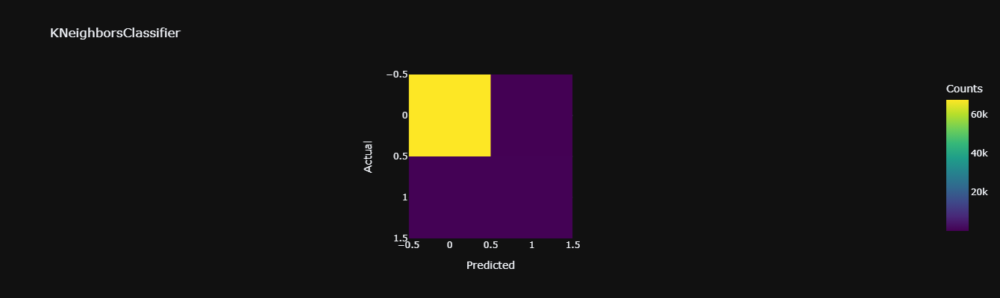

SVC Model Test Accuracy Score is:  0.9967020994670357
SVC Model Test F1 Score is:  0.5851851851851851
SVC Mean_absolute_error:  0.0032979005329642824
SVC Mean_squared_error:  0.0032979005329642824
SVC Root_mean_squared_error:  0.05742735004302638
SVC R2_score:  0.38632995982484364
SVC Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.91      0.43      0.59       367

    accuracy                           1.00     67922
   macro avg       0.96      0.72      0.79     67922
weighted avg       1.00      1.00      1.00     67922



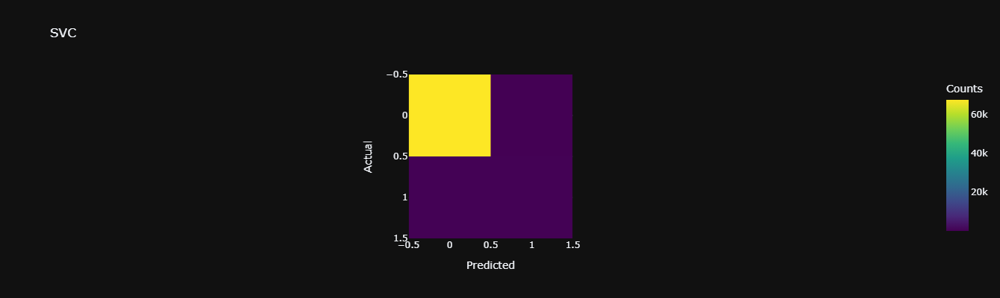

GaussianNB Model Test Accuracy Score is:  0.9884131798239156
GaussianNB Model Test F1 Score is:  0.3066079295154185
GaussianNB Mean_absolute_error:  0.011586820176084332
GaussianNB Mean_squared_error:  0.011586820176084332
GaussianNB Root_mean_squared_error:  0.10764209295663259
GaussianNB R2_score:  -1.1560639357939646
GaussianNB Classification_report: 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     67555
           1       0.23      0.47      0.31       367

    accuracy                           0.99     67922
   macro avg       0.61      0.73      0.65     67922
weighted avg       0.99      0.99      0.99     67922



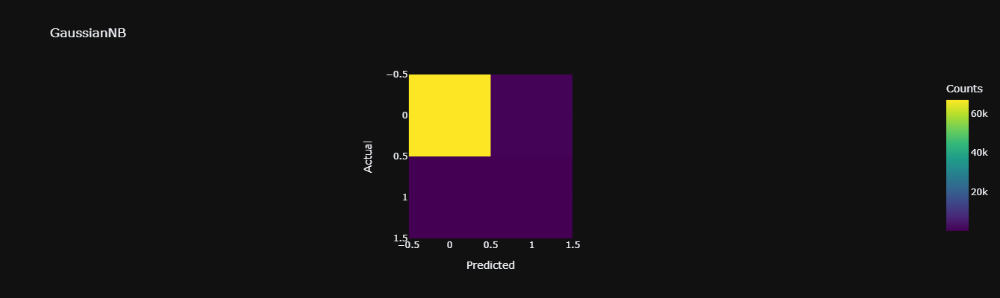

DecisionTreeClassifier Model Test Accuracy Score is:  0.9976296339919319
DecisionTreeClassifier Model Test F1 Score is:  0.7803547066848566
DecisionTreeClassifier Mean_absolute_error:  0.002370366008068078
DecisionTreeClassifier Mean_squared_error:  0.002370366008068078
DecisionTreeClassifier Root_mean_squared_error:  0.048686404756031
DecisionTreeClassifier R2_score:  0.5589246586241063
DecisionTreeClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.78      0.78      0.78       367

    accuracy                           1.00     67922
   macro avg       0.89      0.89      0.89     67922
weighted avg       1.00      1.00      1.00     67922



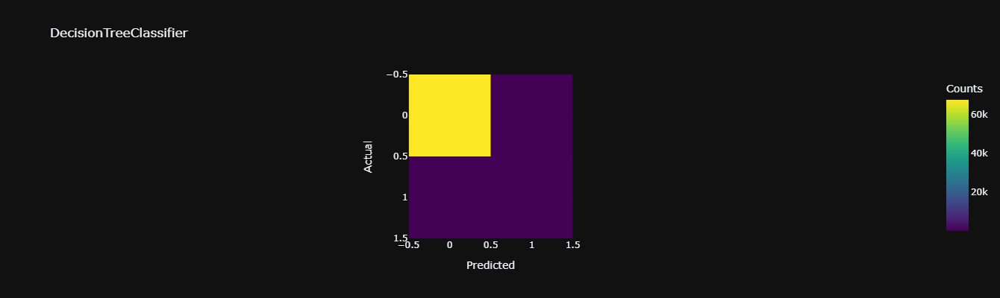

RandomForestClassifier Model Test Accuracy Score is:  0.9981302081799711
RandomForestClassifier Model Test F1 Score is:  0.8
RandomForestClassifier Mean_absolute_error:  0.0018697918200288567
RandomForestClassifier Mean_squared_error:  0.0018697918200288567
RandomForestClassifier Root_mean_squared_error:  0.04324108948707071
RandomForestClassifier R2_score:  0.6520710040078355
RandomForestClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.95      0.69      0.80       367

    accuracy                           1.00     67922
   macro avg       0.97      0.85      0.90     67922
weighted avg       1.00      1.00      1.00     67922



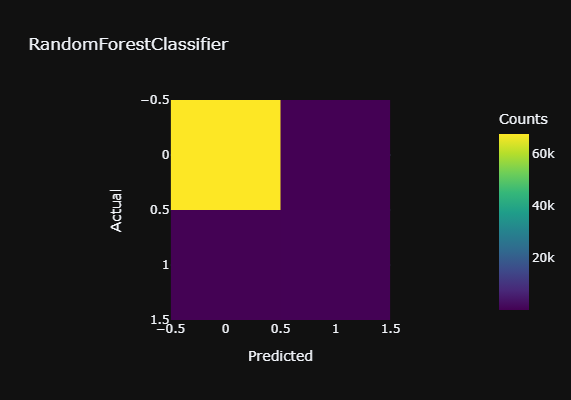

XGBClassifier Model Test Accuracy Score is:  0.9984099408144637
XGBClassifier Model Test F1 Score is:  0.8363636363636363
XGBClassifier Mean_absolute_error:  0.0015900591855363506
XGBClassifier Mean_squared_error:  0.0015900591855363506
XGBClassifier Root_mean_squared_error:  0.039875546209880944
XGBClassifier R2_score:  0.7041233734869782
XGBClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.94      0.75      0.84       367

    accuracy                           1.00     67922
   macro avg       0.97      0.88      0.92     67922
weighted avg       1.00      1.00      1.00     67922



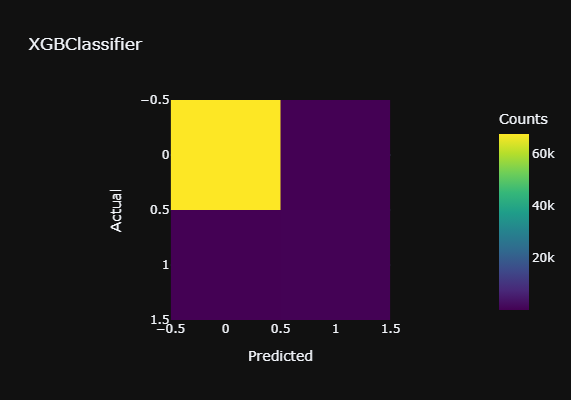

[LightGBM] [Info] Number of positive: 1415, number of negative: 270270
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 920
[LightGBM] [Info] Number of data points in the train set: 271685, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.005208 -> initscore=-5.252292
[LightGBM] [Info] Start training from score -5.252292
LGBMClassifier Model Test Accuracy Score is:  0.9956862283207208
LGBMClassifier Model Test F1 Score is:  0.5759768451519537
LGBMClassifier Mean_absolute_error:  0.004313771679279173
LGBMClassifier Mean_squared_error:  0.004313771679279173
LGBMClassifier Root_mean_squared_error:  0.0656793093696879
LGBMClassifier R2_score:  0.19729767066374637
LGBMClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
          

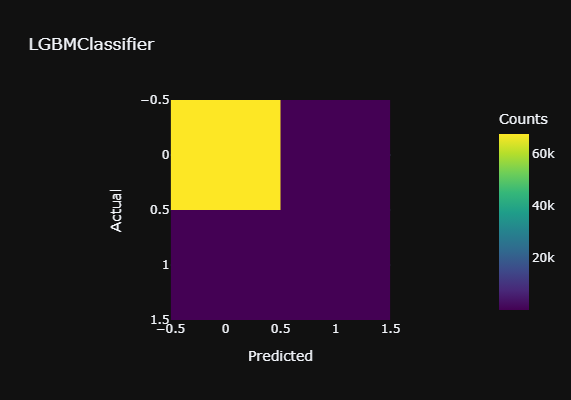

GradientBoostingClassifier Model Test Accuracy Score is:  0.9956862283207208
GradientBoostingClassifier Model Test F1 Score is:  0.448210922787194
GradientBoostingClassifier Mean_absolute_error:  0.004313771679279173
GradientBoostingClassifier Mean_squared_error:  0.004313771679279173
GradientBoostingClassifier Root_mean_squared_error:  0.0656793093696879
GradientBoostingClassifier R2_score:  0.19729767066374637
GradientBoostingClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.73      0.32      0.45       367

    accuracy                           1.00     67922
   macro avg       0.86      0.66      0.72     67922
weighted avg       0.99      1.00      0.99     67922



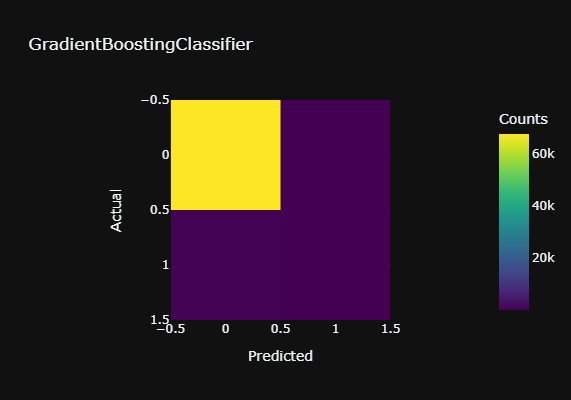

AdaBoostClassifier Model Test Accuracy Score is:  0.9960690203468685
AdaBoostClassifier Model Test F1 Score is:  0.5118829981718465
AdaBoostClassifier Mean_absolute_error:  0.0039309796531315335
AdaBoostClassifier Mean_squared_error:  0.0039309796531315335
AdaBoostClassifier Root_mean_squared_error:  0.06269752509574468
AdaBoostClassifier R2_score:  0.2685272288983628
AdaBoostClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.78      0.38      0.51       367

    accuracy                           1.00     67922
   macro avg       0.89      0.69      0.75     67922
weighted avg       1.00      1.00      1.00     67922



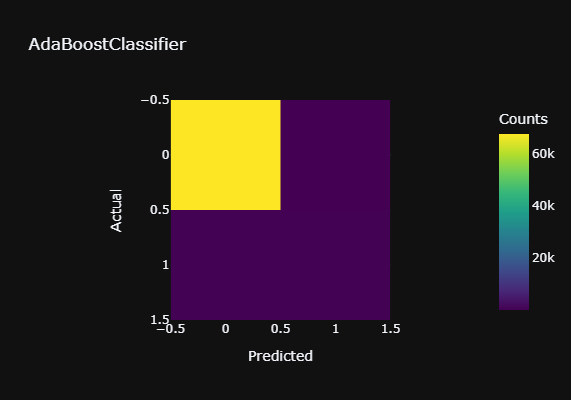

LogisticRegression Model Test Accuracy Score is:  0.9941108919054209
LogisticRegression Model Test F1 Score is:  0.0
LogisticRegression Mean_absolute_error:  0.005889108094579076
LogisticRegression Mean_squared_error:  0.005889108094579076
LogisticRegression Root_mean_squared_error:  0.07674052446119375
LogisticRegression R2_score:  -0.09583935745563643
LogisticRegression Classification_report: 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     67555
           1       0.00      0.00      0.00       367

    accuracy                           0.99     67922
   macro avg       0.50      0.50      0.50     67922
weighted avg       0.99      0.99      0.99     67922



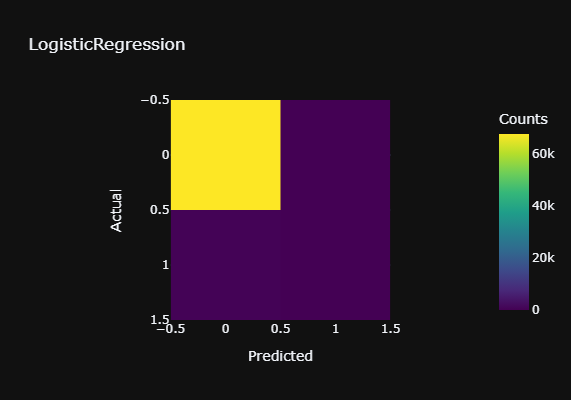

In [34]:
# model building

knn=KNeighborsClassifier()
svc=SVC()
nb=GaussianNB()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
xgb=XGBClassifier()
lgb=LGBMClassifier()
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
lr=LogisticRegression()


models = [knn, svc, nb, dtc, rfc, xgb, lgb, gbc, abc, lr]

for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(type(model).__name__, "Model Test Accuracy Score is: ", accuracy_score(y_test, y_pred))
    print(type(model).__name__, "Model Test F1 Score is: ", f1_score(y_test, y_pred))
    print(type(model).__name__,"Mean_absolute_error: ",mean_absolute_error(y_test, y_pred))
    print(type(model).__name__,"Mean_squared_error: ",mean_squared_error(y_test, y_pred))
    print(type(model).__name__,"Root_mean_squared_error: ",np.sqrt(mean_squared_error(y_test, y_pred)))
    print(type(model).__name__,"R2_score: ",r2_score(y_test, y_pred))
    print(type(model).__name__,"Classification_report: \n",classification_report(y_test, y_pred))
    fig=px.imshow(confusion_matrix(y_test, y_pred),color_continuous_scale="Viridis",title=type(model).__name__,
                  width=400,height=400,labels=dict(x="Predicted", y="Actual", color="Counts"),template="plotly_dark")
    fig.show()

C:\Users\ele_9\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:\Users\ele_9\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:

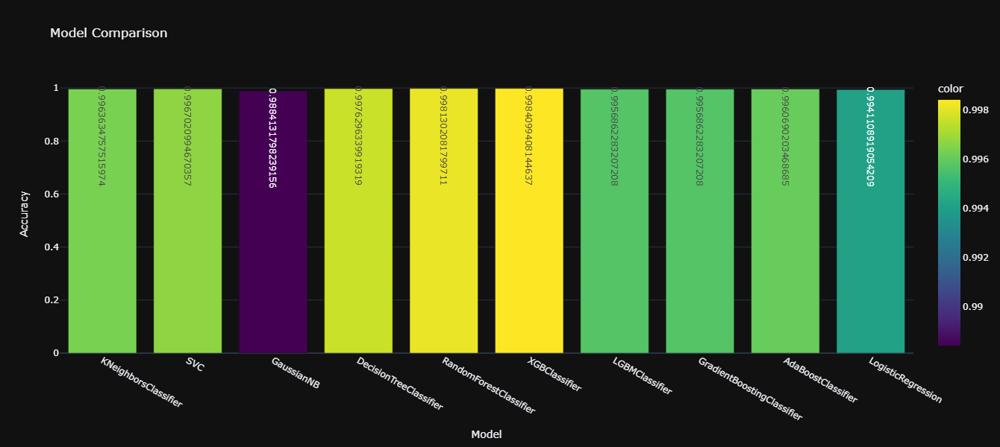

In [35]:
# comparing all model accuracy:   

models = [knn, svc, nb, dtc, rfc, xgb, lgb, gbc, abc, lr]

fig=px.bar(x=[type(model).__name__ for model in models], y=[accuracy_score(y_test, model.predict(X_test)) for model in models],
         color=[accuracy_score(y_test, model.predict(X_test)) for model in models], color_continuous_scale="Viridis",
            title="Model Comparison", labels=dict(x="Model", y="Accuracy"), template="plotly_dark", width=800,
            height=600,text=[accuracy_score(y_test, model.predict(X_test)) for model in models])
#fig.update_layout(yaxis_range=[0.97,0.99]) 
fig.show()


FEATURE IMPORTANCE

RandomForestClassifier Model Feature Importance: 



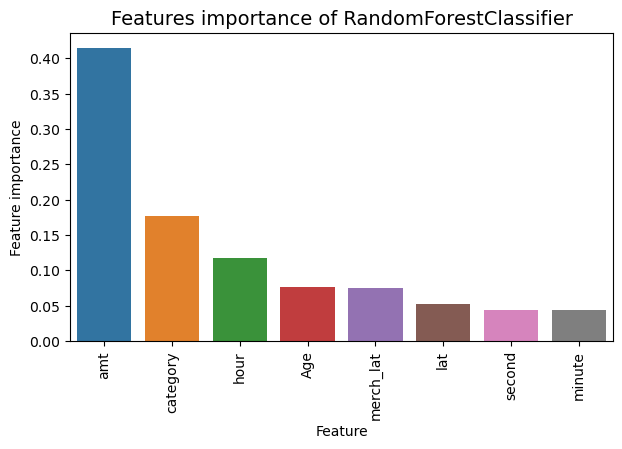

XGBClassifier Model Feature Importance: 



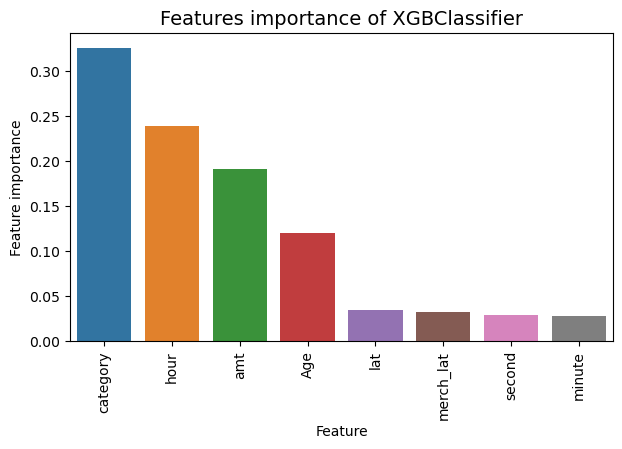

LGBMClassifier Model Feature Importance: 



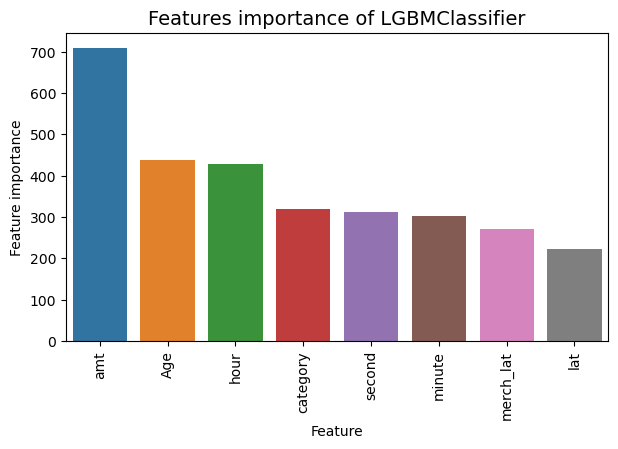

GradientBoostingClassifier Model Feature Importance: 



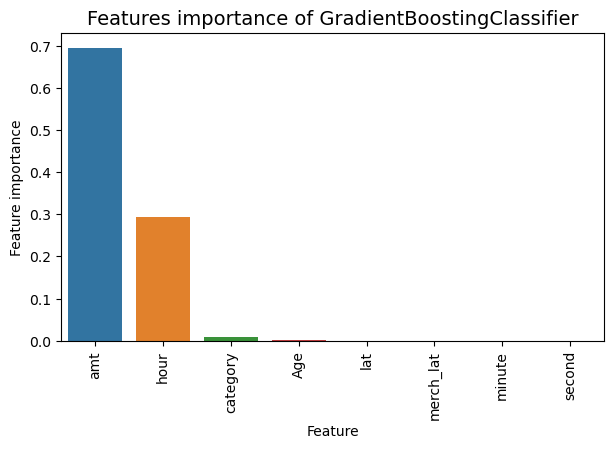

DecisionTreeClassifier Model Feature Importance: 



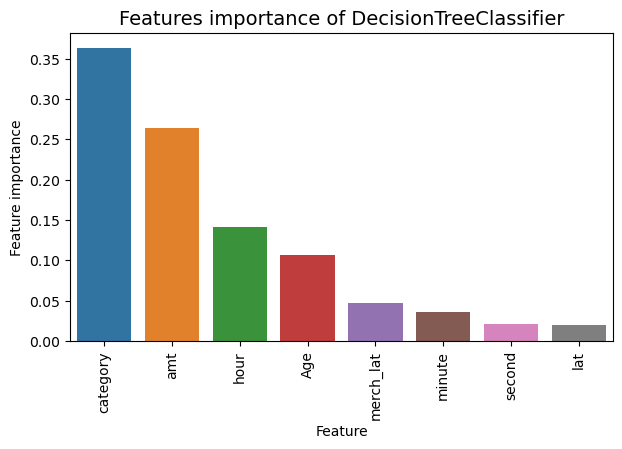

In [39]:
# Feature Importance

# for all models

models = [rfc, xgb, lgb, gbc,svc,dtc, lr]

target = 'is_fraud'
predictors = ['category',"amt", 'lat', 'merch_lat', 'hour', 'minute', 'second', 'Age']

for model in models:
    # there is no feature importance attribute in SVC and Logistic regression
    if model == svc or model == lr:
           continue
    print(type(model).__name__, "Model Feature Importance: \n")
    tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': model.feature_importances_})
    tmp = tmp.sort_values(by='Feature importance',ascending=False)
    plt.figure(figsize = (7,4))
    plt.title('Features importance of '+type(model).__name__,fontsize=14)
    s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
    s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.show()  

PCA

Text(0.5, 1.0, 'PCA: 2 Component')

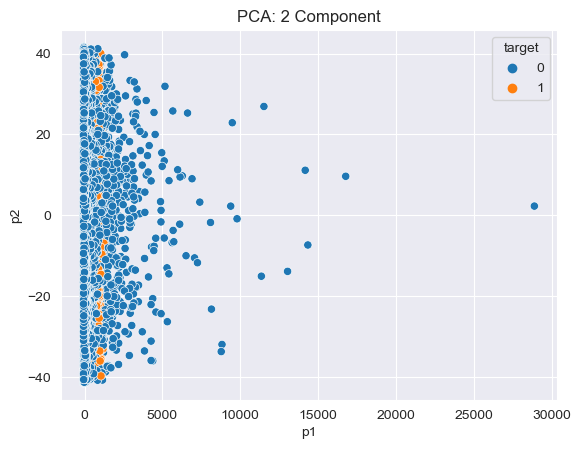

In [40]:
from sklearn.decomposition import PCA

pca=PCA(n_components=2)
X_reduced=pca.fit_transform(X)

#visualization of reduced data:
sns.set_style("darkgrid")
pca_data=pd.DataFrame(X_reduced,columns=["p1","p2"])
pca_data["target"]=y
sns.scatterplot(x="p1",y="p2",hue="target",data=pca_data)
plt.title("PCA: 2 Component")

C:\Users\ele_9\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



KNeighborsClassifier Model Test Accuracy Score is:  0.9943170106887312
KNeighborsClassifier Model Test F1 Score is:  0.25769230769230766
KNeighborsClassifier Mean_absolute_error:  0.005682989311268809
KNeighborsClassifier Mean_squared_error:  0.005682989311268809
KNeighborsClassifier Root_mean_squared_error:  0.07538560413811651
KNeighborsClassifier R2_score:  -0.05748497994468904
KNeighborsClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.44      0.18      0.26       367

    accuracy                           0.99     67922
   macro avg       0.72      0.59      0.63     67922
weighted avg       0.99      0.99      0.99     67922



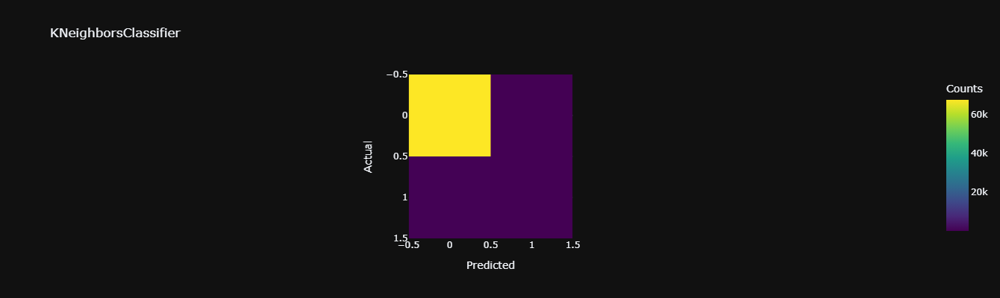

RandomForestClassifier Model Test Accuracy Score is:  0.9943022879184947
RandomForestClassifier Model Test F1 Score is:  0.23968565815324167
RandomForestClassifier Mean_absolute_error:  0.005697712081505256
RandomForestClassifier Mean_squared_error:  0.005697712081505256
RandomForestClassifier Root_mean_squared_error:  0.07548319072154579
RandomForestClassifier R2_score:  -0.06022457833832817
RandomForestClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.43      0.17      0.24       367

    accuracy                           0.99     67922
   macro avg       0.71      0.58      0.62     67922
weighted avg       0.99      0.99      0.99     67922



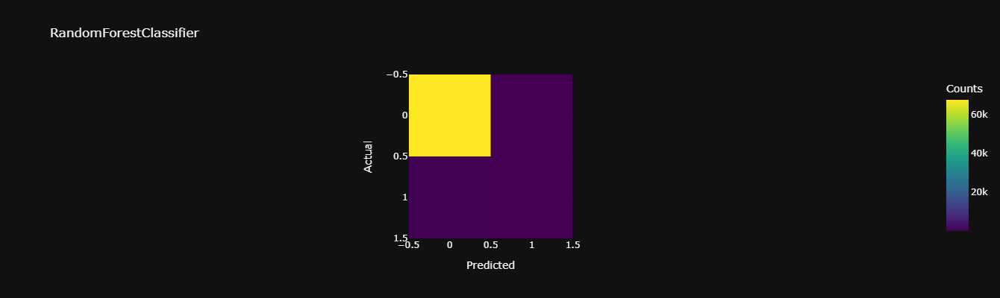

XGBClassifier Model Test Accuracy Score is:  0.9946261888636966
XGBClassifier Model Test F1 Score is:  0.23480083857442346
XGBClassifier Mean_absolute_error:  0.005373811136303407
XGBClassifier Mean_squared_error:  0.005373811136303407
XGBClassifier Root_mean_squared_error:  0.07330628306157261
XGBClassifier R2_score:  4.658632173182298e-05
XGBClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.51      0.15      0.23       367

    accuracy                           0.99     67922
   macro avg       0.75      0.58      0.62     67922
weighted avg       0.99      0.99      0.99     67922



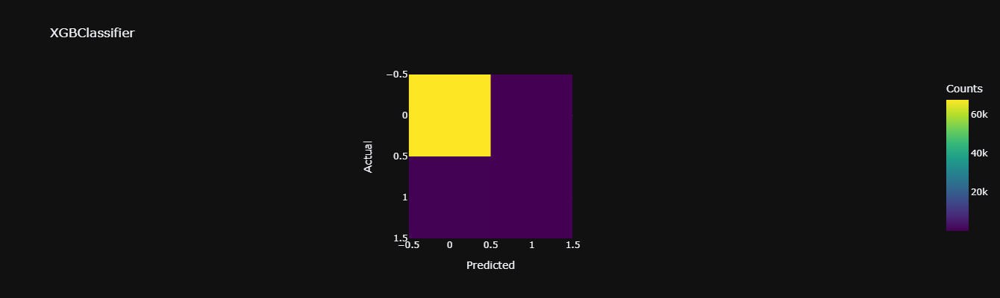

GradientBoostingClassifier Model Test Accuracy Score is:  0.994346456229204
GradientBoostingClassifier Model Test F1 Score is:  0.15418502202643172
GradientBoostingClassifier Mean_absolute_error:  0.005653543770795913
GradientBoostingClassifier Mean_squared_error:  0.005653543770795913
GradientBoostingClassifier Root_mean_squared_error:  0.07519005100939827
GradientBoostingClassifier R2_score:  -0.052005783157411
GradientBoostingClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.40      0.10      0.15       367

    accuracy                           0.99     67922
   macro avg       0.70      0.55      0.58     67922
weighted avg       0.99      0.99      0.99     67922



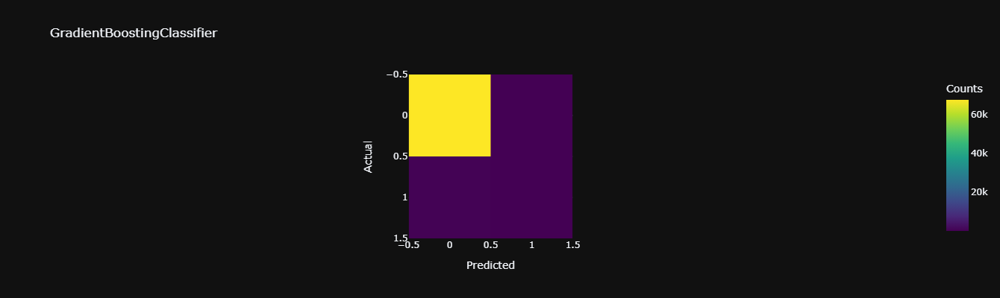

SVC Model Test Accuracy Score is:  0.9948911987279526
SVC Model Test F1 Score is:  0.2785862785862786
SVC Mean_absolute_error:  0.005108801272047349
SVC Mean_squared_error:  0.005108801272047349
SVC Root_mean_squared_error:  0.07147587895260435
SVC R2_score:  0.049359357407235405
SVC Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.59      0.18      0.28       367

    accuracy                           0.99     67922
   macro avg       0.79      0.59      0.64     67922
weighted avg       0.99      0.99      0.99     67922



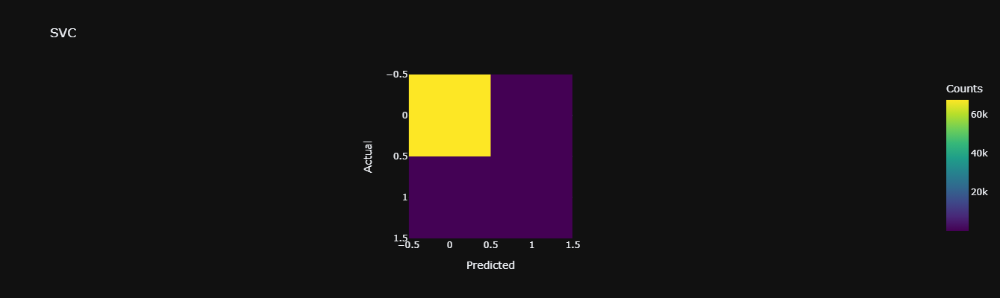

DecisionTreeClassifier Model Test Accuracy Score is:  0.991151615087895
DecisionTreeClassifier Model Test F1 Score is:  0.2245161290322581
DecisionTreeClassifier Mean_absolute_error:  0.008848384912105062
DecisionTreeClassifier Mean_squared_error:  0.008848384912105062
DecisionTreeClassifier Root_mean_squared_error:  0.09406585412414573
DecisionTreeClassifier R2_score:  -0.6464986345770936
DecisionTreeClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     67555
           1       0.21      0.24      0.22       367

    accuracy                           0.99     67922
   macro avg       0.60      0.62      0.61     67922
weighted avg       0.99      0.99      0.99     67922



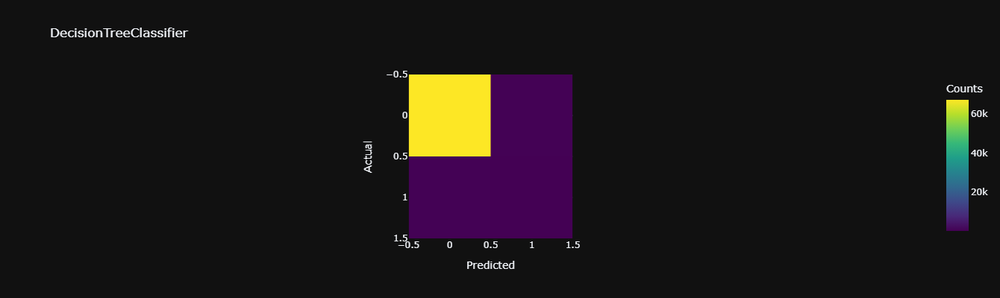

LogisticRegression Model Test Accuracy Score is:  0.9941256146756574
LogisticRegression Model Test F1 Score is:  0.0
LogisticRegression Mean_absolute_error:  0.0058743853243426285
LogisticRegression Mean_squared_error:  0.0058743853243426285
LogisticRegression Root_mean_squared_error:  0.0766445387770233
LogisticRegression R2_score:  -0.0930997590619973
LogisticRegression Classification_report: 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     67555
           1       0.00      0.00      0.00       367

    accuracy                           0.99     67922
   macro avg       0.50      0.50      0.50     67922
weighted avg       0.99      0.99      0.99     67922



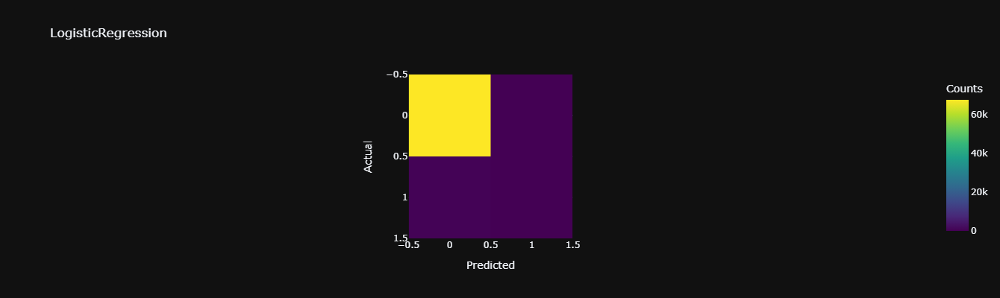

In [41]:
# after pca, model building

X_train,X_test,y_train,y_test=train_test_split(X_reduced,y,test_size=0.2,random_state=42)

models =[knn,rfc,xgb,gbc,svc,dtc,lr]

for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(type(model).__name__, "Model Test Accuracy Score is: ", accuracy_score(y_test, y_pred))
    print(type(model).__name__, "Model Test F1 Score is: ", f1_score(y_test, y_pred))
    print(type(model).__name__,"Mean_absolute_error: ",mean_absolute_error(y_test, y_pred))
    print(type(model).__name__,"Mean_squared_error: ",mean_squared_error(y_test, y_pred))
    print(type(model).__name__,"Root_mean_squared_error: ",np.sqrt(mean_squared_error(y_test, y_pred)))
    print(type(model).__name__,"R2_score: ",r2_score(y_test, y_pred))
    print(type(model).__name__,"Classification_report: \n",classification_report(y_test, y_pred))
    fig=px.imshow(confusion_matrix(y_test, y_pred),color_continuous_scale="Viridis",title=type(model).__name__,
                  width=400,height=400,labels=dict(x="Predicted", y="Actual", color="Counts"),template="plotly_dark")
    fig.show()

AUC-ROC CURVE

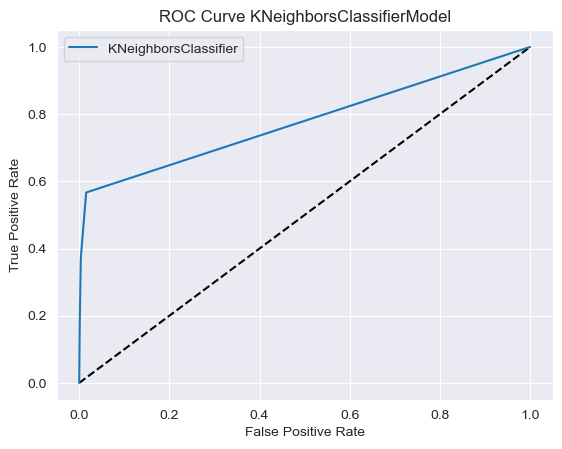

KNeighborsClassifier Model AUC Score is:  0.7775966580465165


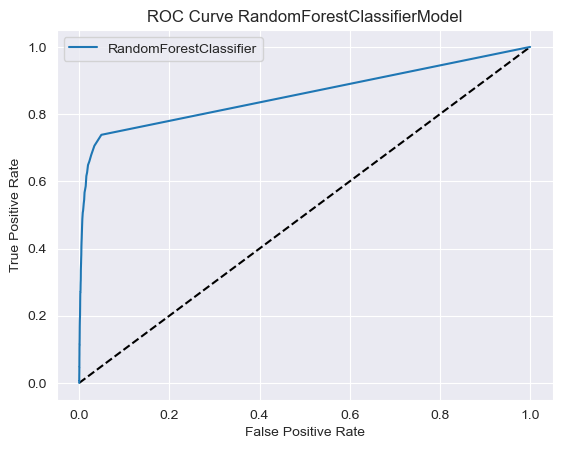

RandomForestClassifier Model AUC Score is:  0.8565566416061835


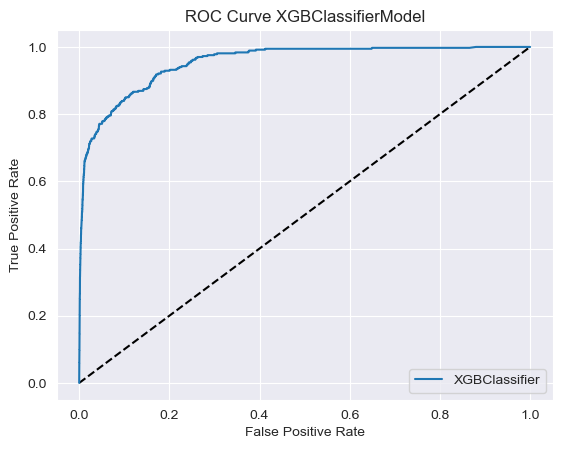

XGBClassifier Model AUC Score is:  0.9543718036186882


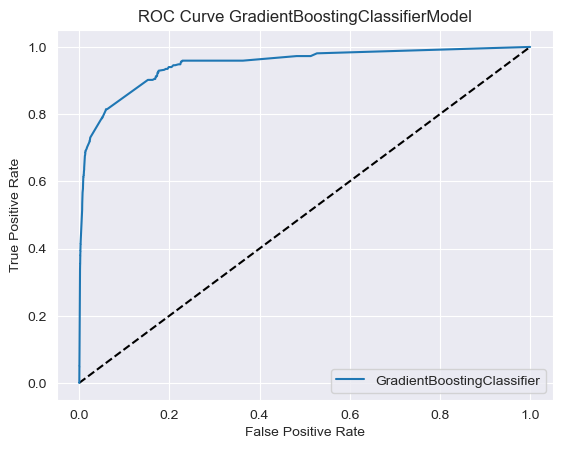

GradientBoostingClassifier Model AUC Score is:  0.9480272507798168


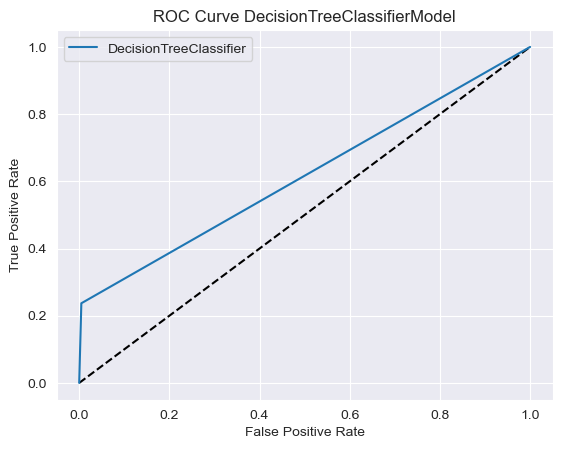

DecisionTreeClassifier Model AUC Score is:  0.6161527684476289


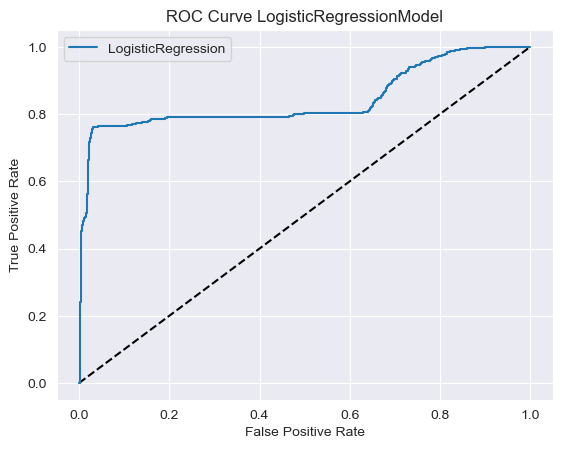

LogisticRegression Model AUC Score is:  0.8419634259056653


In [42]:
from sklearn.metrics import roc_curve, auc

models = [knn, rfc, xgb, gbc, dtc, lr]

for model in models:
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot([0, 1], [0, 1], "k--")
    plt.plot(fpr, tpr, label=type(model).__name__)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve "+type(model).__name__+"Model")
    plt.legend()
    plt.show()
    print(type(model).__name__, "Model AUC Score is: ", auc(fpr, tpr))